In [1]:
import numpy as np
from numpy.random import randn
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap
import seaborn as sns
import matplotlib.colors as mcolors
from sklearn import datasets
from tqdm import tqdm
import plotly.graph_objects as go
from copy import copy

In [2]:
color_blind_list = sns.color_palette("pastel", 2)
my_cmap = ListedColormap(color_blind_list)

In [3]:
plt.rcParams.update({"text.usetex": True, "font.size": 20})

# Perceptron

## Data

In [4]:
# create 2 distributions
n1, n2 = 500, 500
mu1, mu2 = [1, 1], [-1, -1]
sigmas1, sigmas2 = [0.9, 0.9], [0.9, 0.9]
dist1 = np.array(mu1 + randn(n1, 2) * sigmas1) 
dist2 = np.array(mu2 + randn(n2, 2) * sigmas2)
# merge data
y = np.hstack([np.ones(n1), -np.ones(n2)])
X = np.vstack([dist1, dist2])

## Model

In [5]:
class Perceptron:
    
    def __init__(self, loss_name, n_iter=30, alpha=2e-4):
        self.w         = np.zeros((n_iter, 3))
        self.w[0,:]    = np.random.randn(3) # weight and bias
        self.n_iter    = n_iter
        self.alpha     = alpha
        self.loss_name = 'MSE'

    def predict(self, X, i=-1): 
         return np.sign(X @ self.w[i,1:] + self.w[i,0])
        
    def gradient_descent(self, i, X, y):
        self.w[i,:] = self.w[i-1, :] - self.alpha * self.gradient_loss(X, y, i-1)
        
    def loss(self, X, y, i=-1): # MSE or CE
        y_pred = self.predict(X, i)
        if self.loss_name=='MSE':
            loss_value = ((y - y_pred)**2).mean()
        return loss_value
    
    def gradient_loss(self, X, y, i=-1):
        y_pred = self.predict(X,i)
        if self.loss_name=='MSE':
            gradient = -2. * np.dot(y - y_pred, np.hstack((np.ones((X.shape[0], 1)), X)))
        return gradient

## Training

$\mathcal{L} = \left(y-\hat{y} \right)^2$

In [6]:
perceptron = Perceptron('MSE')
losses, accuracies = [], []
perceptrons = [perceptron]
for i in range(1, 30):
    # gradient descent step
    perceptron.gradient_descent(i, X, y)
    perceptrons.append(perceptron)
    # update performances metrics
    loss_value = perceptron.loss(X, y , i)
    accuracy_value = (y==perceptron.predict(X,i)).sum()/len(y)
    losses.append(loss_value), accuracies.append(accuracy_value)

## Results

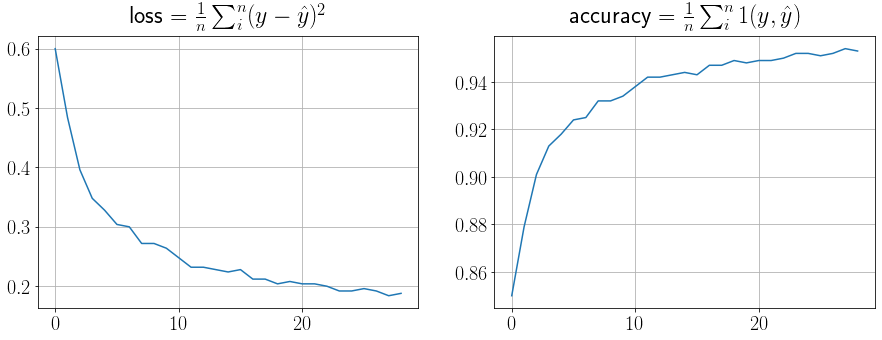

In [7]:
plt.figure(figsize=(15,5))
plt.subplot(121), plt.plot(losses), plt.title(r'loss = $\frac{1}{n} \sum_i^n (y-\hat{y})^2$'), plt.grid()
plt.subplot(122), plt.plot(accuracies), plt.title(r'accuracy = $\frac{1}{n} \sum_i^n 1(y,\hat{y})$'), plt.grid()
plt.show()

In [8]:
# discretize all space
step=100
xmin_0, xmax_0 = np.min(X[:, 0]), np.max(X[:, 0])
xmin_1, xmax_1 = np.min(X[:, 1]), np.max(X[:, 1])
delta_0 = (xmax_0 - xmin_0)
delta_1 = (xmax_1 - xmin_1)
xx, yy = np.meshgrid(np.arange(xmin_0,xmax_0,delta_0/step), np.arange(xmin_1,xmax_1,delta_1/step))
XX = np.c_[xx.ravel(), yy.ravel()]

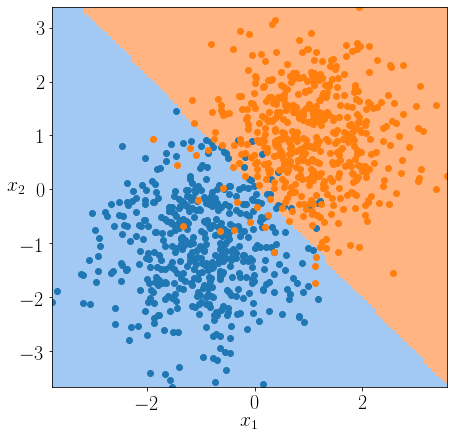

In [9]:
# compute and display predictions
plt.figure(figsize=(10,7))
for i in range(30):
    z = perceptron.predict(XX)
    z = z.reshape(xx.shape)
    plt.imshow(z, origin='lower', extent=[xmin_0, xmax_0, xmin_1, xmax_1], cmap=my_cmap)
plt.plot(X[y==-1,0], X[y==-1,1], 'o')
plt.plot(X[y==1,0], X[y==1,1], 'o')
plt.ylim([X[:, 1].min(), X[:, 1].max()]), plt.xlim([X[:, 0].min(), X[:, 0].max()])
plt.xlabel('$x_1$'), plt.ylabel('$x_2$', rotation=0)
plt.show()

# Multi Layer Perceptron

## Data

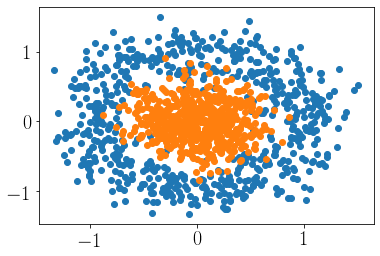

In [18]:
X, y = datasets.make_circles(n_samples=1200, noise=0.2, factor=0.3)
y = y.reshape(-1,1)
y_ = y.squeeze()
plt.plot(X[y_==0,0], X[y_==0,1], 'o')
plt.plot(X[y_==1,0], X[y_==1,1], 'o')
plt.show()

## Model

In [19]:
class MultiLayerPerceptron:
    
    def __init__(self, n_0, n_1, n_2):
        self.W1 = np.random.randn(n_0, n_1)
        self.b1 = np.zeros(shape=(1, n_1))
        self.W2 = np.random.randn(n_1, n_2)
        self.b2 = np.zeros(shape=(1, n_2))        

    def forward(self, X):
        self.A0 = X
        self.Z1 = np.dot(self.A0, self.W1) + self.b1
        self.A1 = relu(self.Z1)
        self.Z2 = np.dot(self.A1, self.W2) + self.b2
        self.A2 = sigmoid(self.Z2)
        y_pred = self.A2
        return y_pred

    def backward(self, X, y):
        m = y.shape[0]
        self.dZ2 = self.A2 - y
        self.dW2 = 1/m * np.dot(self.A1.T, self.dZ2)
        self.db2 = 1/m * np.sum(self.dZ2, axis=0, keepdims=True)
        self.dA1 = np.dot(self.dZ2, self.W2.T)
        self.dZ1 = np.multiply(self.dA1, d_relu(self.Z1))
        self.dW1 = 1/m * np.dot(X.T, self.dZ1)
        self.db1 = 1/m * np.sum(self.dZ1, axis=0, keepdims=True)

    def gradient_descent(self, alpha):
        self.W1 = self.W1 - alpha * self.dW1
        self.b1 = self.b1 - alpha * self.db1
        self.W2 = self.W2 - alpha * self.dW2
        self.b2 = self.b2 - alpha * self.db2

In [20]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def relu(x):
    return x * (x > 0)

def d_relu(x):
    y = x
    y[x<=0] = 0
    y[x>0] = 1
    return y

def get_accuracy(y, y_pred):
    y_pred[y_pred>=0.5] = 1
    y_pred[y_pred<0.5]  = 0
    return np.sum(y_pred==y)/len(y)

def get_loss(y, y_pred):
    loss = -(y*np.log(y_pred)+(1-y)*np.log(1-y_pred))
    return np.sum(loss)/len(y)

## Training

$\mathcal{L}= - \left( y \log(\hat{y}) + (1-y) \log(1-\hat{y}) \right)$

In [21]:
n_in, n_1, n_out = X.shape[1], 10, 1
mlp = MultiLayerPerceptron(n_in, n_1, n_out)
losses, accuracies, iterations = [], [], [0]
alpha = 5e-1
mlps = [copy(mlp)]
for i in tqdm(range(1, 1000)):
    mlp.forward(X)
    mlp.backward(X, y)
    mlp.gradient_descent(alpha)
    # performances metrics
    loss_value = get_loss(y, mlp.forward(X))
    accuracy_value = get_accuracy(y, mlp.forward(X))
    losses.append(loss_value)
    if ((i==1) or (accuracy_value > acc+0.015)): 
        mlps.append(copy(mlp))
        iterations.append(i)
        acc = accuracy_value
    accuracies.append(accuracy_value)

100%|███████████████████████████████████████████████████████████████████████████████| 999/999 [00:01<00:00, 609.39it/s]


## Results

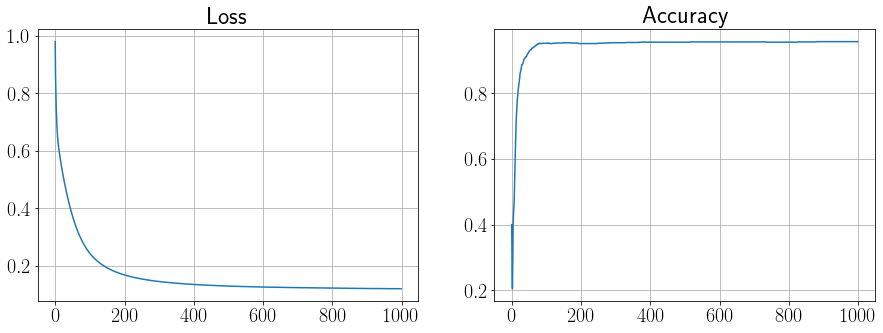

In [22]:
plt.figure(figsize=(15,5)),
plt.subplot(121), plt.plot(losses), plt.title('Loss'), plt.grid()
plt.subplot(122), plt.plot(accuracies), plt.title('Accuracy'), plt.grid()
plt.show()

In [23]:
# discretize all space
step=100
xmin_0, xmax_0 = np.min(X[:, 0]), np.max(X[:, 0])
xmin_1, xmax_1 = np.min(X[:, 1]), np.max(X[:, 1])
delta_0, delta_1 = (xmax_0 - xmin_0), (xmax_1 - xmin_1)
range_0, range_1 = np.arange(xmin_0,xmax_0,delta_0/step), np.arange(xmin_1,xmax_1,delta_1/step)
xx, yy = np.meshgrid(range_0, range_1)
XX = np.c_[xx.ravel(), yy.ravel()]

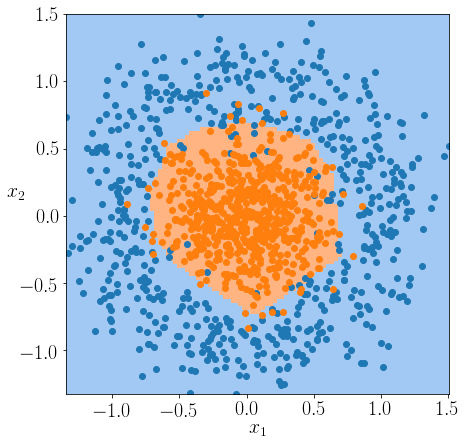

In [24]:
# compute and display predictions at the end of training
plt.figure(figsize=(10,7))
z = mlp.forward(XX)
z = z.reshape(xx.shape)
plt.imshow(z, origin='lower', extent=[xmin_0, xmax_0, xmin_1, xmax_1], cmap=my_cmap)
y = y.squeeze()
plt.plot(X[y==0,0], X[y==0,1], 'o')
plt.plot(X[y==1,0], X[y==1,1], 'o')
plt.ylim([X[:, 1].min(), X[:, 1].max()]), plt.xlim([X[:, 0].min(), X[:, 0].max()])
plt.xlabel('$x_1$'), plt.ylabel('$x_2$', rotation=0)
plt.show()

# Display with Plotly

## MLP

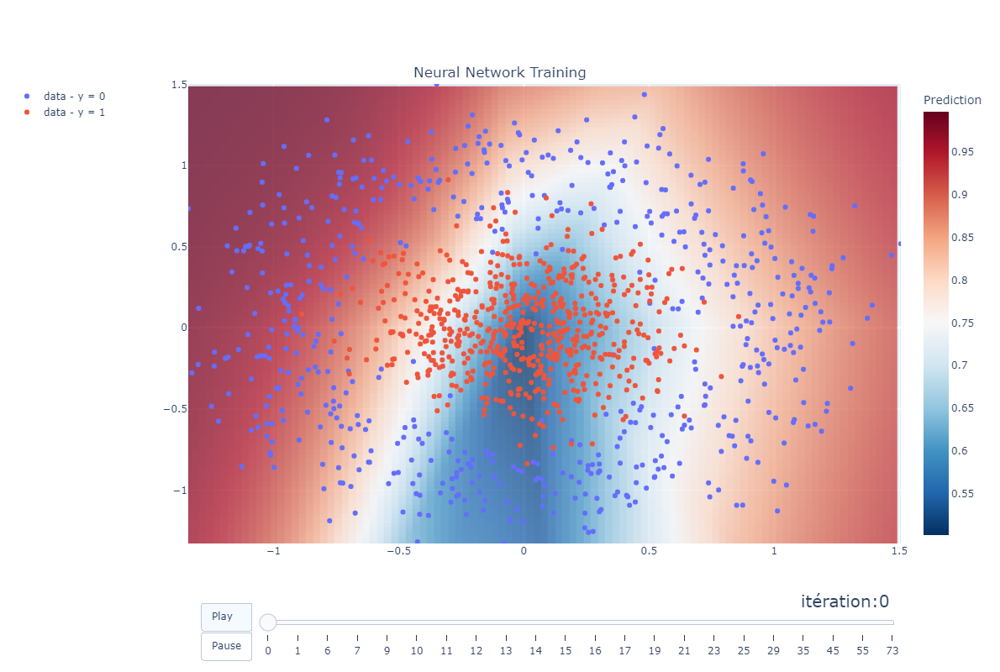

In [36]:
data = [go.Heatmap(x=range_0, y=range_1, z=mlps[0].forward(XX).reshape(xx.shape), opacity=0.75, colorscale='RdBu_r', colorbar=dict(title="Prediction"), hovertemplate='<b>prediction y=%{z:.1f}</b><br>(%{x:.1f},%{y:.1f})<extra></extra>'),
        go.Scatter(x=X[y==0,0], y=X[y==0,1], name=r'data - y = 0', mode='markers', marker_color='#636EFA', hovertemplate='<b>class y=0</b><br>(%{x:.1f},%{y:.1f})<extra></extra>'), 
        go.Scatter(x=X[y==1,0], y=X[y==1,1], name=r'data - y = 1', mode='markers', marker_color='#EF553B', hovertemplate='<b>class y=1</b><br>(%{x:.1f},%{y:.1f})<extra></extra>')]

updatemenus = [dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None]),
                                             dict(label="Pause", method="animate", args=[None, {"frame": {"duration": 0, "redraw": False}, "mode": "immediate", "transition": {"duration": 0}}]),],
                    x=0.1, y=0, xanchor="right", yanchor="top", pad={"r":10,"t":70})]

sliders = {"active":0,"yanchor":"top","xanchor":"left", "len":0.9,"x":0.1,"y":0, 
           "currentvalue":{"font":{"size": 20},"prefix":"itération:","visible":True, "xanchor":"right"}, 
           "transition":{"duration": 300, "easing": "cubic-in-out"},"pad":{"b":10, "t":50},
           "steps": [{"args":[[i],{"frame":{"duration":300,"redraw":True},"mode":"immediate","transition":{"duration":300}}],"label":iterations[i],"method":"animate"} for i in range(len(mlps))]}

layout = go.Layout(title="Neural Network Training", title_x=0.5, title_y=0.9,
                    width=900, height=800, autosize=False,
                    updatemenus=updatemenus,
                    yaxis_range=[xmin_1, xmax_1], xaxis_range=[xmin_0, xmax_0],
                    legend=dict(x=-0.25, y=1),
                    coloraxis_colorbar=dict(yanchor="top", y=1, x=0),
                    sliders=[sliders])

frames = [go.Frame(data=go.Heatmap(x=range_0, y=range_1, z=mlp.forward(XX).reshape(xx.shape), opacity=0.75, colorscale='RdBu_r', colorbar=dict(title="Prediction")), name=i) for i,mlp in enumerate(mlps)]

fig = go.Figure(data=data, layout=layout, frames=frames)
fig.show()
fig.write_html("mlp_training.html")

In [ ]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=2, cols=2, specs=[[{'rowspan': 2}, {}], [None, {}]])
fig.add_trace(go.Scatter(y=accuracies), row=1, col=2)
fig.add_trace(go.Scatter(y=losses), row=2, col=2)
fig.add_trace(go.Heatmap(x=range_0, y=range_1, z=mlps[0].forward(XX).reshape(xx.shape), opacity=0.75, colorscale='RdBu_r', colorbar=dict(title="Prediction")), row=1, col=1)
fig.update_layout(height=800, width=1400)
fig.show()